## Vehicle Detection Project

The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction, binned color features extraction, and histograms of color feature extraction  on a labeled training set of images and train a classifier Linear SVM classifier
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream  and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.

---

### Imports

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import pickle

from moviepy.editor import VideoFileClip
from IPython.display import HTML

from skimage.feature import hog

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.svm import LinearSVC

from scipy.ndimage.measurements import label
%matplotlib qt
%matplotlib inline

## Load and preprocess the data

In [5]:
def loadImg(imgPath, color_space='RGB', preprocessImgFn=None):
    img = cv2.imread(imgPath)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    if color_space != 'RGB':
            if color_space == 'HSV':
                img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                img = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                img = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if preprocessImgFn is not None:
        img = preprocessImgFn(img)
        
    return img
    

# Make a list of car and non-car images
car_images = glob.glob('./data/vehicles/**/*.png', recursive=True)
non_car_images = glob.glob('./data/non-vehicles/**/*.png', recursive=True)

print("There are", len(car_images), "car images")
print("There are", len(non_car_images), "non car image")

There are 8792 car images
There are 8968 non car image


## Visualization functions

In [6]:
def vis_feature(featureFn, title, numSamples=5):
    for i in range(numSamples):
        idx_c = random.randrange(len(car_images))
        idx_nc = random.randrange(len(non_car_images))
        
        img_c = loadImg(car_images[idx_c])
        img_nc = loadImg(non_car_images[idx_nc])
        
        f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img_c)
        ax1.set_title('Original Car Image', fontsize=25)
    
        ax2.plot(featureFn(img_c))
        ax2.set_title("Car " + title, fontsize=25)
        
        ax3.imshow(img_nc)
        ax3.set_title("Original Non-Car Image", fontsize=25)
        
        ax4.plot(featureFn(img_nc))
        ax4.set_title("Non-Car " + title, fontsize=25)

## First, I'll look at different types of features

### Colour feature selection

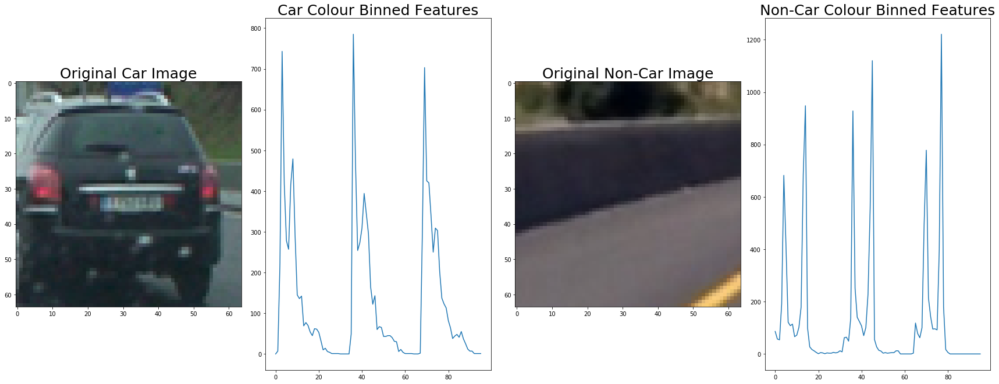

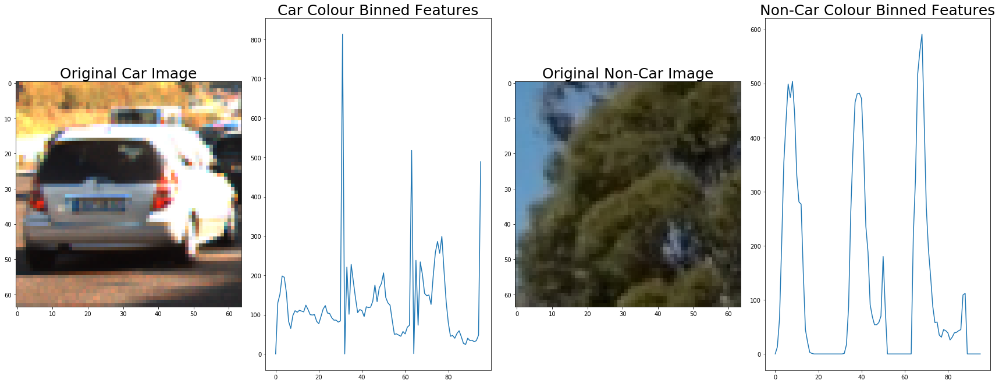

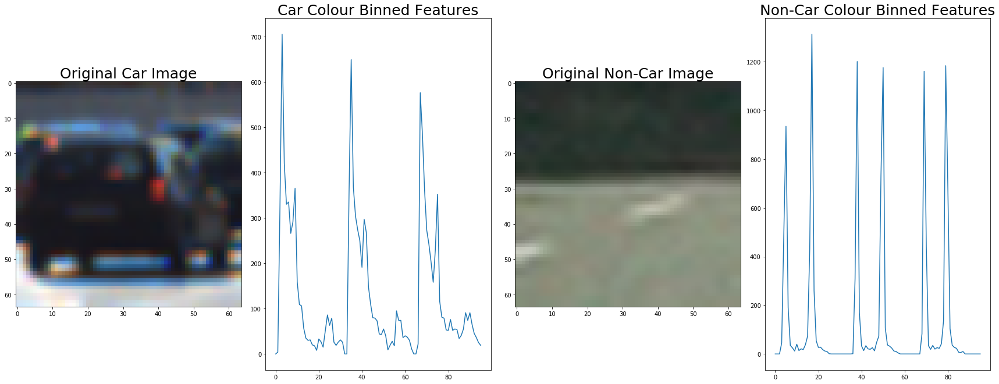

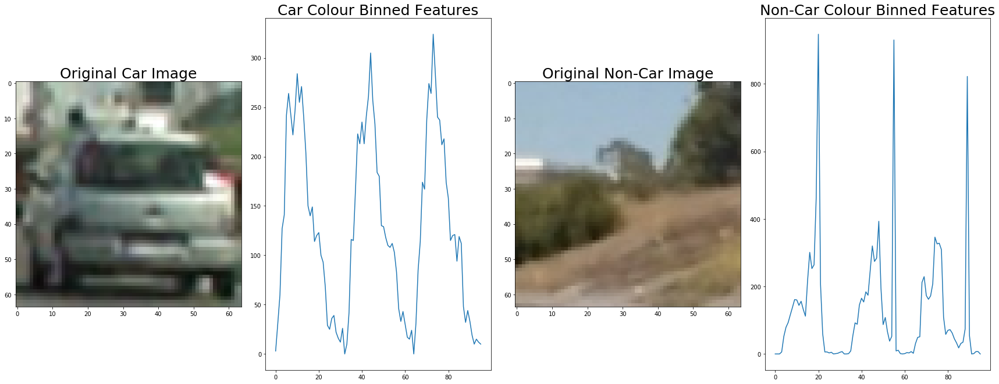

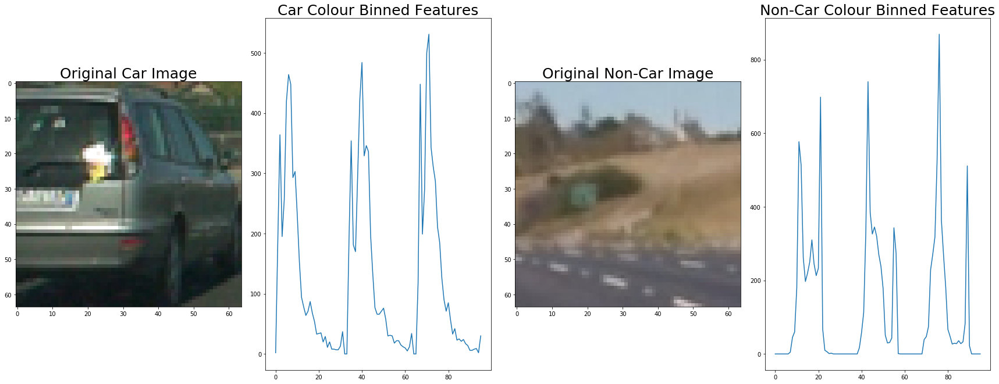

In [7]:
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the RGB channels separately
    rhist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    ghist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    bhist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((rhist[0], ghist[0], bhist[0]))

    return  hist_features

def color_hist_full(img, nbins=32, bins_range=(0, 256)):
    rhist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    ghist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    bhist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    
    # Generating bin centers
    bin_edges = rhist[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
    hist_features = np.concatenate((rhist[0], ghist[0], bhist[0]))
    
    return rhist, ghist, bhist, bin_centers, hist_features

vis_feature(color_hist, "Colour Binned Features")

### Space feature

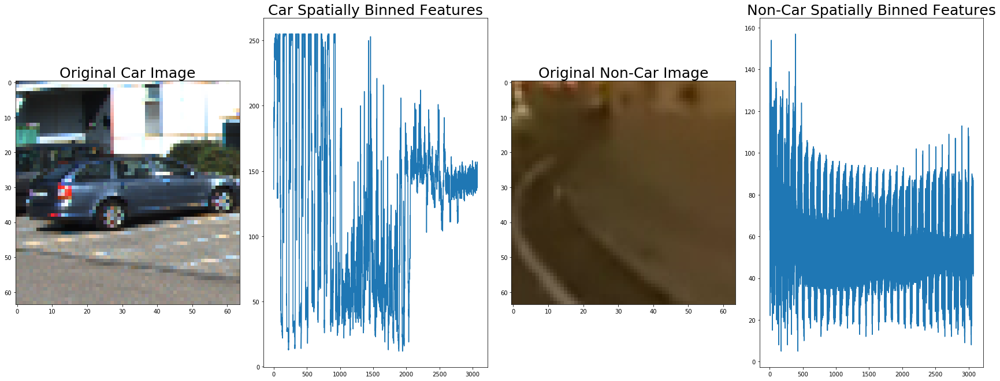

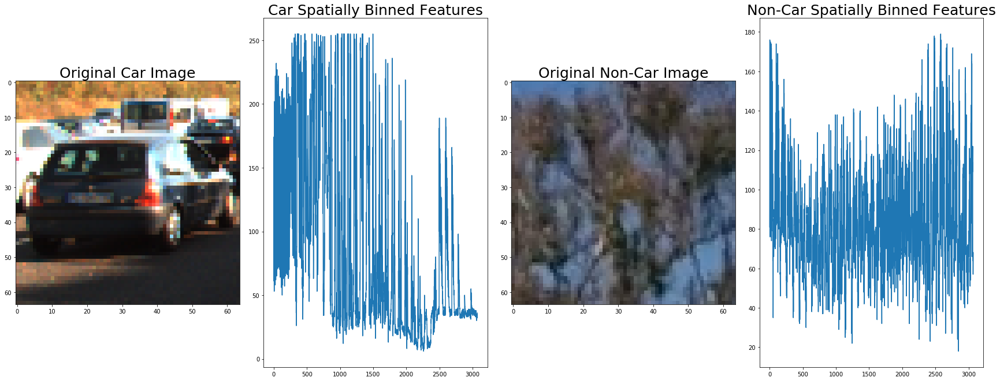

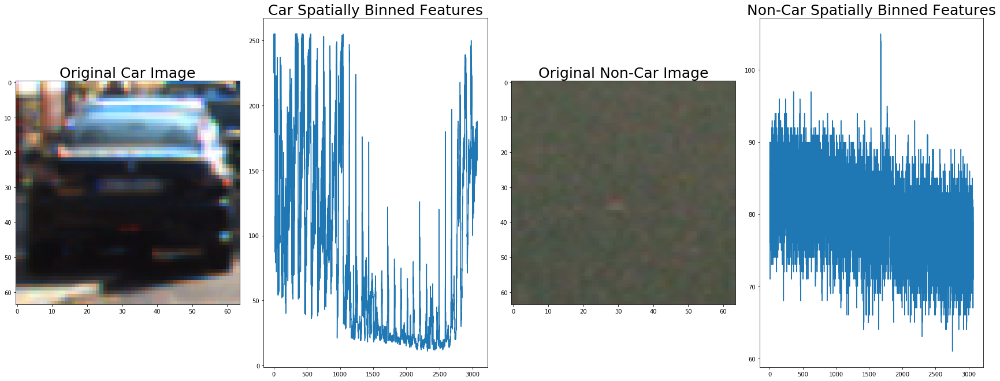

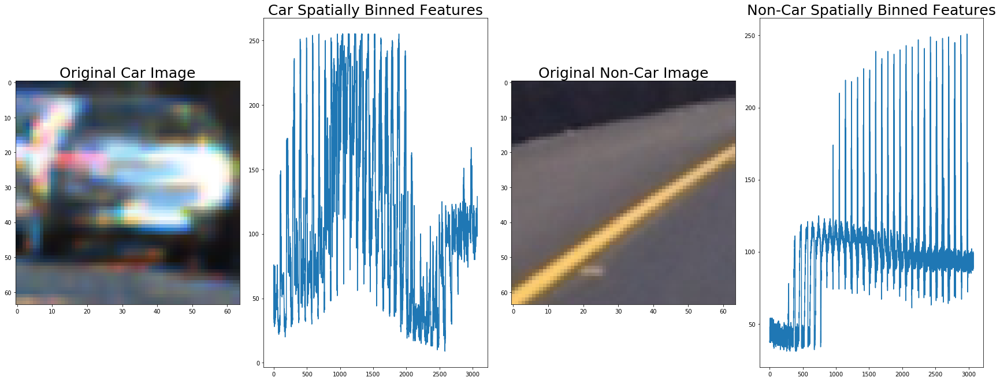

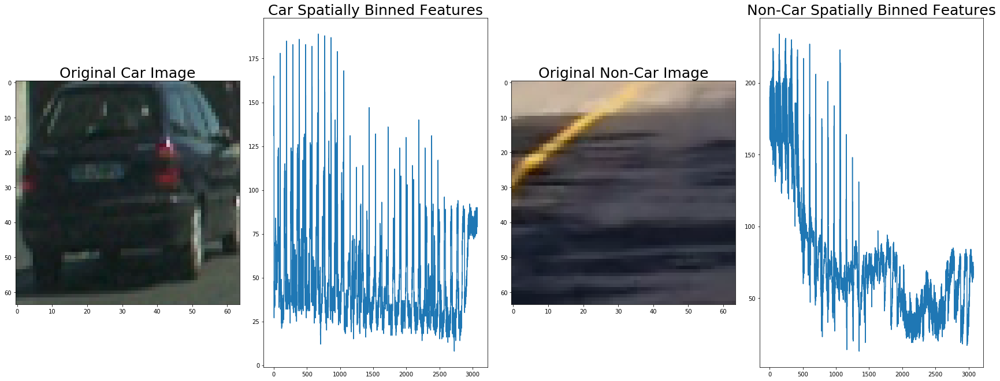

In [8]:
def bin_spatial(img, size=(32, 32)):
    return cv2.resize(img, size).ravel() 
    
vis_feature(bin_spatial, 'Spatially Binned Features')

### Gradient feature selection (HOG)

In [9]:
def get_hog_features(img, orient=11, pix_per_cell=16, cell_per_block=2, vis=False, feature_vec=True):
    if vis:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        return features

### HOG Visualization

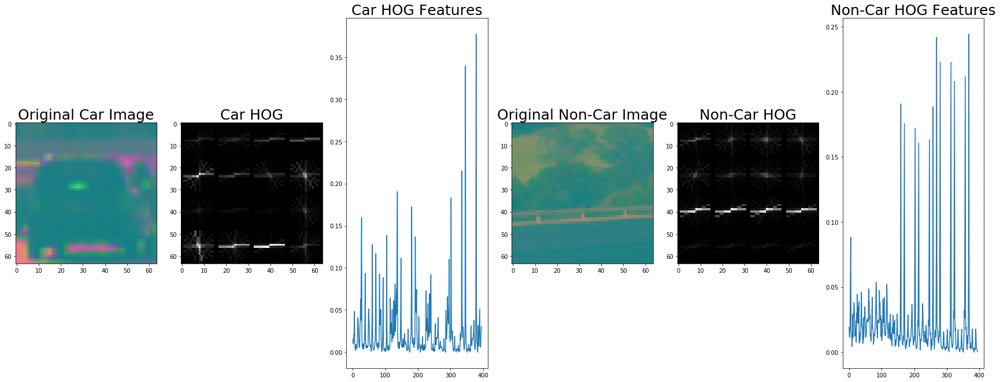

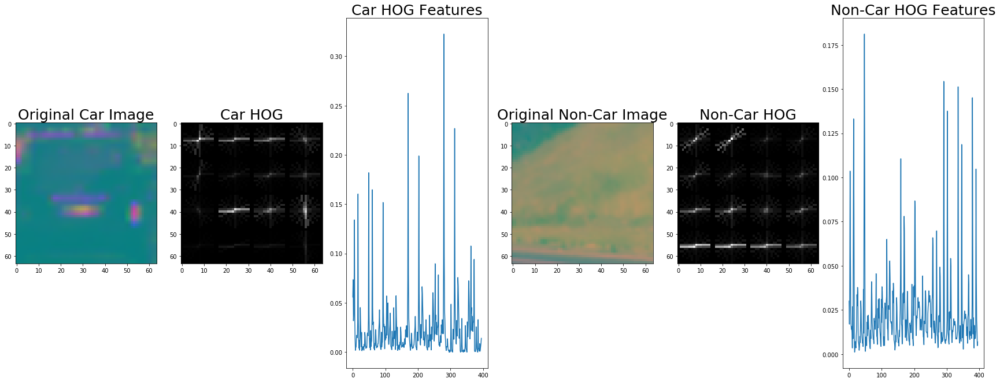

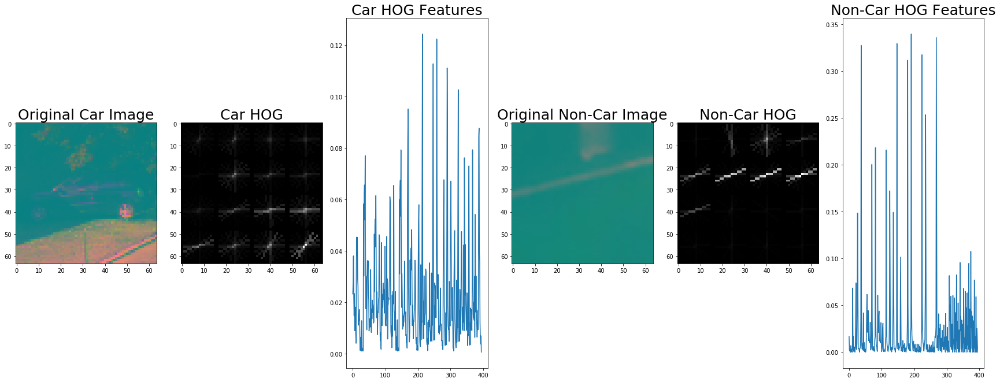

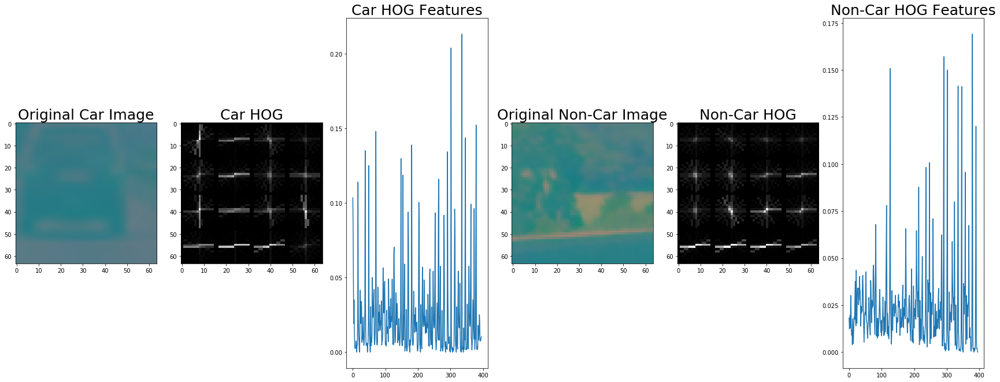

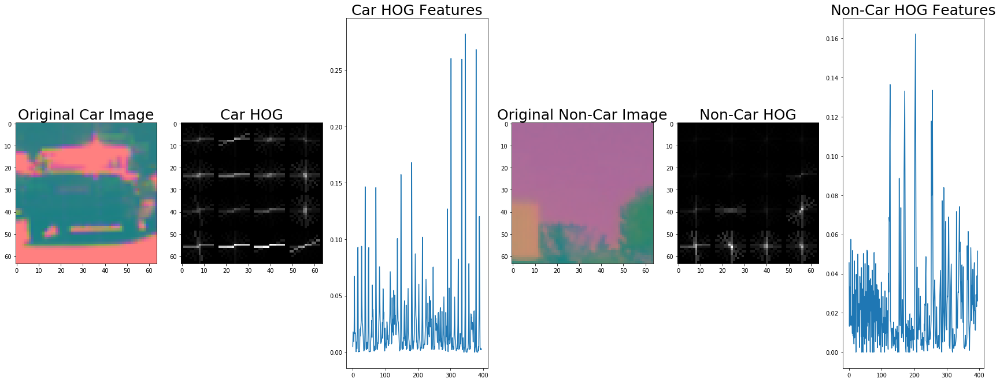

In [10]:
def hog_vis(numSamples=5):
    
    title = 'HOG Features'
    count = 1
    for i in range(numSamples):
        idx_c = random.randrange(len(car_images))
        idx_nc = random.randrange(len(non_car_images))
        
        img_c = loadImg(car_images[idx_c], color_space="YUV")
        img_cg = img_c[:,:,0]
        
        img_nc = loadImg(non_car_images[idx_nc], color_space="YUV")
        img_ncg = img_nc[:,:,0]
        
        #img_cg = cv2.cvtColor(img_c, cv2.COLOR_RGB2GRAY)
        #img_ncg = cv2.cvtColor(img_nc, cv2.COLOR_RGB2GRAY)
        
        vect_c, hog_c = get_hog_features(img_cg, vis=True)
        vect_nc, hog_nc = get_hog_features(img_ncg, vis=True)
    
        f, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img_c)
        ax1.set_title('Original Car Image', fontsize=25)
    
        ax2.imshow(hog_c, cmap='gray')
        ax2.set_title('Car HOG', fontsize=25)
        
        ax3.plot(vect_c)
        ax3.set_title("Car " + title, fontsize=25)
        
        ax4.imshow(img_nc)
        ax4.set_title("Original Non-Car Image", fontsize=25)
        
        ax5.imshow(hog_nc, cmap='gray')
        ax5.set_title('Non-Car HOG', fontsize=25)
        
        ax6.plot(vect_nc)
        ax6.set_title("Non-Car " + title, fontsize=25)
        
        cv2.imwrite('''./output_images/HOG/car{0}-org.jpg'''.format(count), img_c)
        cv2.imwrite('''./output_images/HOG/car{0}-hog.jpg'''.format(count), 255*hog_c)
        
        cv2.imwrite('''./output_images/HOG/non-car{0}-org.jpg'''.format(count), img_nc)
        cv2.imwrite('''./output_images/HOG/non-car{0}-hog.jpg'''.format(count), 255*hog_nc)
        count += 1

hog_vis()

### Hog Sub-sampling

In [8]:
  def hog_subsampling(ypos, xpos, nblocks_per_window, hog_):
        hog_feat1 = hog_[0][ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
        hog_feat2 = hog_[1][ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
        hog_feat3 = hog_[2][ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
        hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
        return hog_features

### Combining feature vectors

In [11]:
def getCombineFeatures(img, spatial_size=(32, 32), hist_bins=32, hist_range=(0, 256),
                       orient=11, pix_per_cell=16, cell_per_block=2):
    
    spatial_features = bin_spatial(img, size=spatial_size)
    hist_features = color_hist(img, nbins=hist_bins, bins_range=hist_range)
    features = [spatial_features, hist_features]
    hog_features=[]
    for channel in range(img.shape[2]):
        hog_features.append(get_hog_features(img[:,:,channel], orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True))
    
    hog_features = np.ravel(hog_features)
    features.append(hog_features)
    return np.concatenate(features)

## Drawing Bounding Boxes

In [12]:
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    imgcopy = np.copy(img)
    
    # Iterate through the bounding boxes
    for bbox in bboxes:
        cv2.rectangle(imgcopy, bbox[0], bbox[1], color, thick)
    
    return imgcopy


## Building The Classifier

### Building traning vectors

In [18]:
car_features = []
non_car_features = []

for cimg in car_images:
    img = loadImg(cimg, color_space="YUV")
    fv = getCombineFeatures(img)
    
    car_features.append(fv)
    
for ncimg in non_car_images:
    img = loadImg(ncimg, color_space="YUV")
    fv = getCombineFeatures(img)
    
    non_car_features.append(fv)
y = np.hstack((np.ones(len(car_images)), np.zeros(len(non_car_images))))
X = np.vstack((car_features, non_car_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

### Train test split

In [12]:
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)

### SVM

In [14]:
svm_filename = 'finalized_svm_model.sav'

def build_svm(X_train, X_test, y_train, y_test):
    svc = LinearSVC()
    svc.fit(X_train, y_train)
    print('Test Accuracy of SVC = ', svc.score(X_test, y_test))
    
    return svc

### Train and save model

In [14]:
svc = build_svm(X_train, X_test, y_train, y_test)

pickle.dump(svc, open(svm_filename, 'wb'))

Test Accuracy of SVC =  0.994650900901


### Load Model

In [15]:
svc = pickle.load(open(svm_filename, 'rb'))

## Sliding Window Test

In [19]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

def single_img_features(img, spatial_size=(32, 32),
                        hist_bins=32, orient=11, 
                        pix_per_cell=8, cell_per_block=2):    
    img_features = []     
    
    spatial_features = bin_spatial(img, size=spatial_size)
    img_features.append(spatial_features)
    #print("space", spatial_features.shape)
    
    hist_features = color_hist(img, nbins=hist_bins)
    img_features.append(hist_features)
    #print("hist", hist_features.shape)
    
    hog_features = []
    for channel in range(img.shape[2]):
        hog_features.extend(get_hog_features(img[:,:,channel], 
                                             orient, pix_per_cell, cell_per_block, 
                                             vis=False, feature_vec=True))      
        
    #print("hog", len(hog_features))
    hog_features = np.array(hog_features)
    
    return np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1)
    

def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2):

    on_windows = []
    for window in windows:
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        
        features = single_img_features(test_img, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block)
        
        
        test_features = scaler.transform(features)
        prediction = clf.predict(test_features)
        if prediction == 1:
            on_windows.append(window)
    return on_windows
    

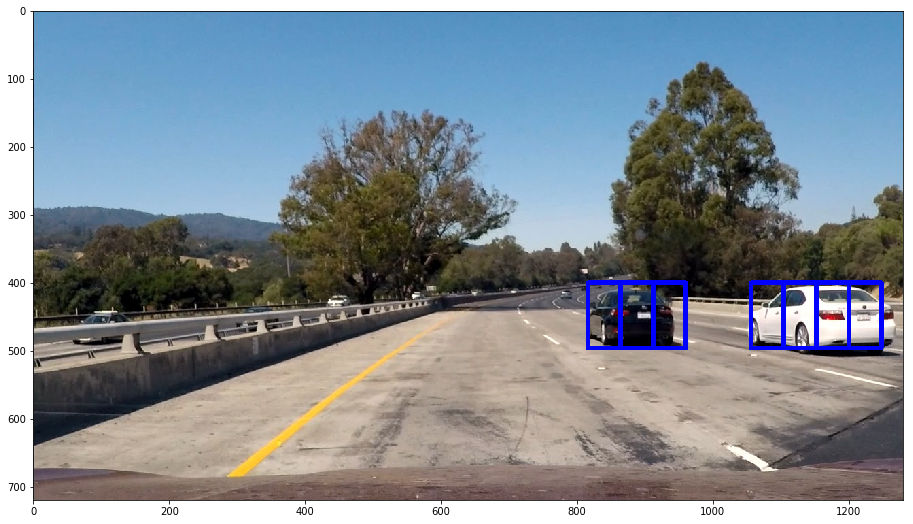

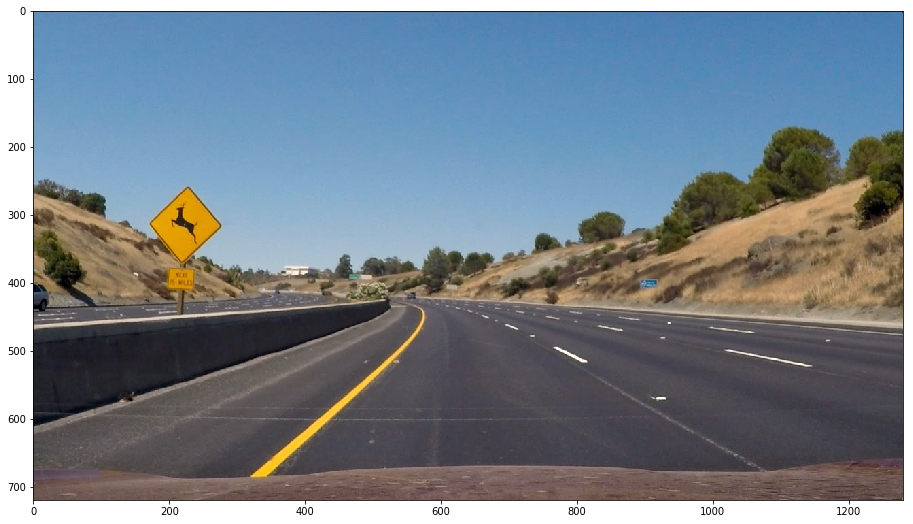

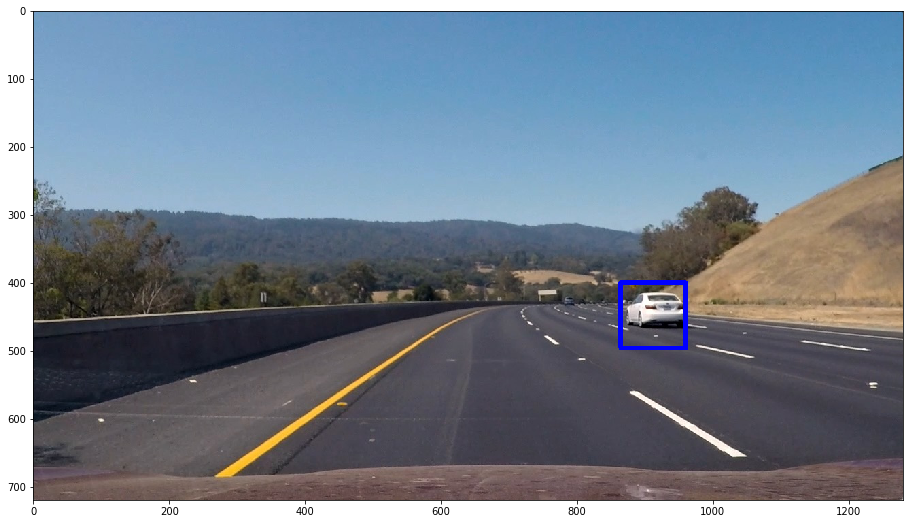

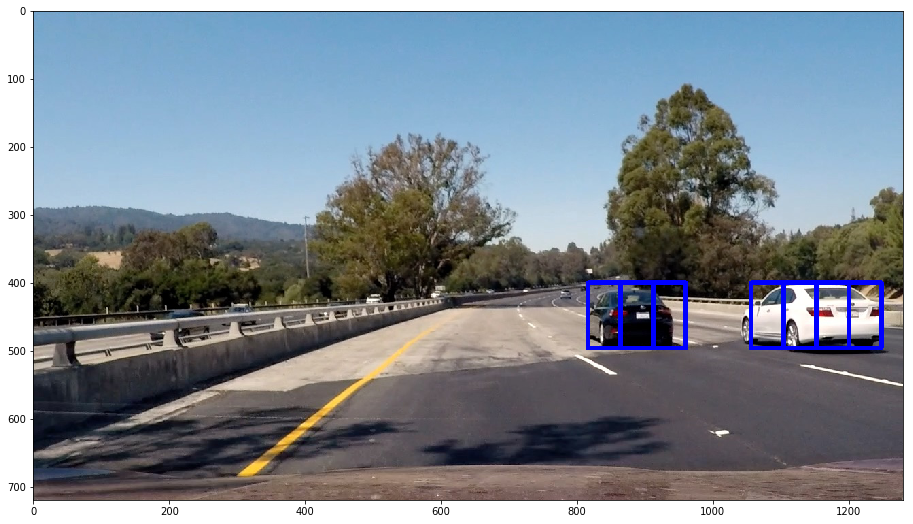

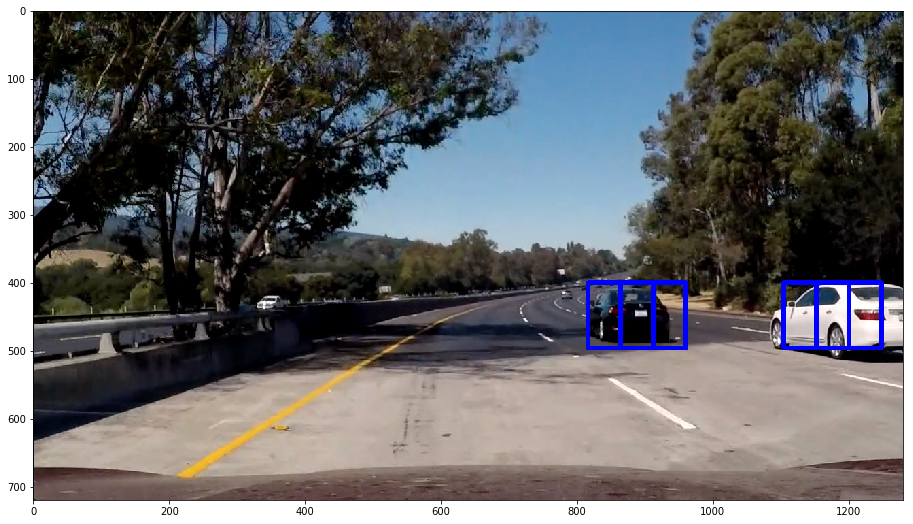

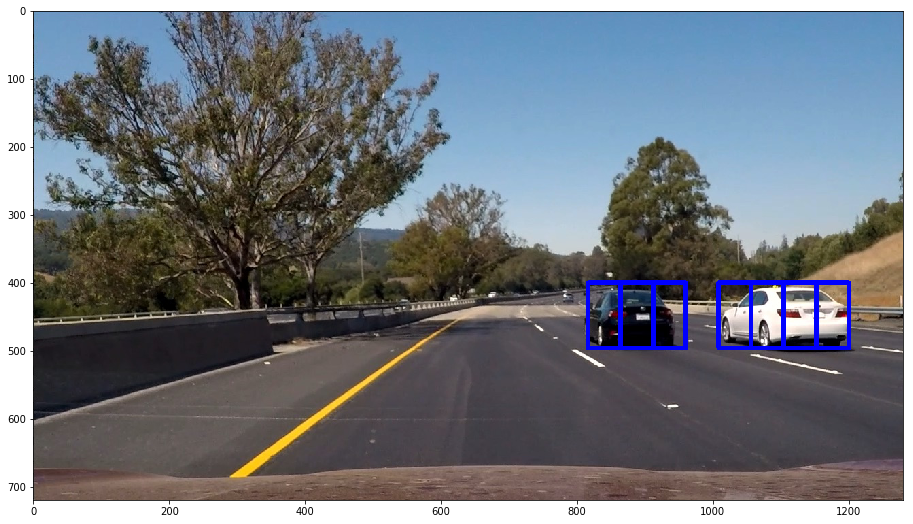

In [20]:
test_imgs = images = glob.glob('./test_images/*.jpg')

orient = 11
pix_per_cell = 16
cell_per_block = 2
spatial_size = (32, 32)
hist_bins = 32
y_start_stop = [400, None]

for ti in test_imgs:
    img = loadImg(ti, color_space="YUV")
    windows = slide_window(img, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=(96, 96), xy_overlap=(0.5, 0.5))

    hot_windows = search_windows(img, windows, svc, X_scaler, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block)                       

    img = loadImg(ti)
    window_img = draw_boxes(img, hot_windows, color=(0, 0, 255), thick=6)   
    f, (ax1) = plt.subplots(1, 1, figsize=(24, 9))
    ax1.imshow(window_img)

### Enhanced Sliding Window 

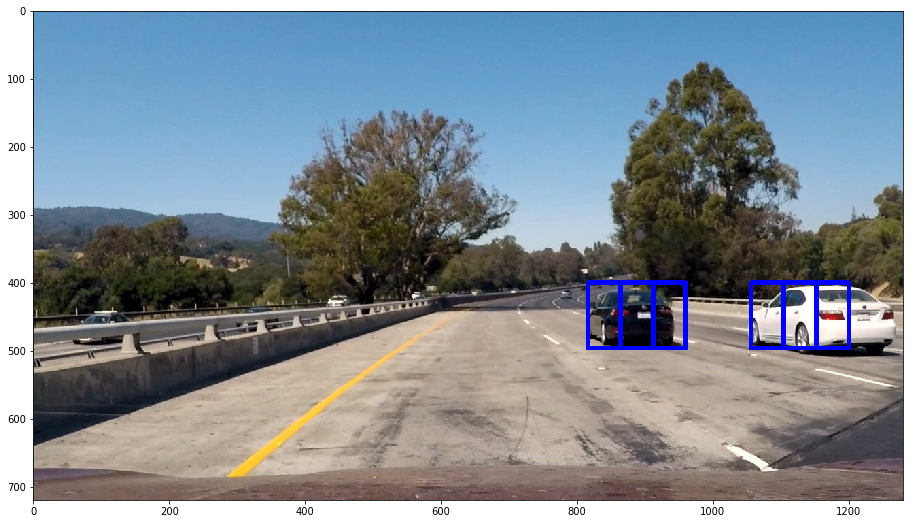

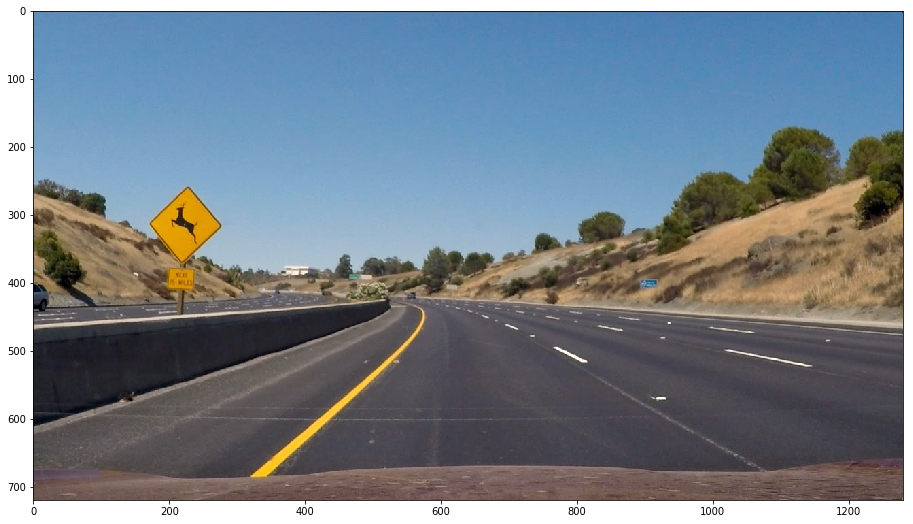

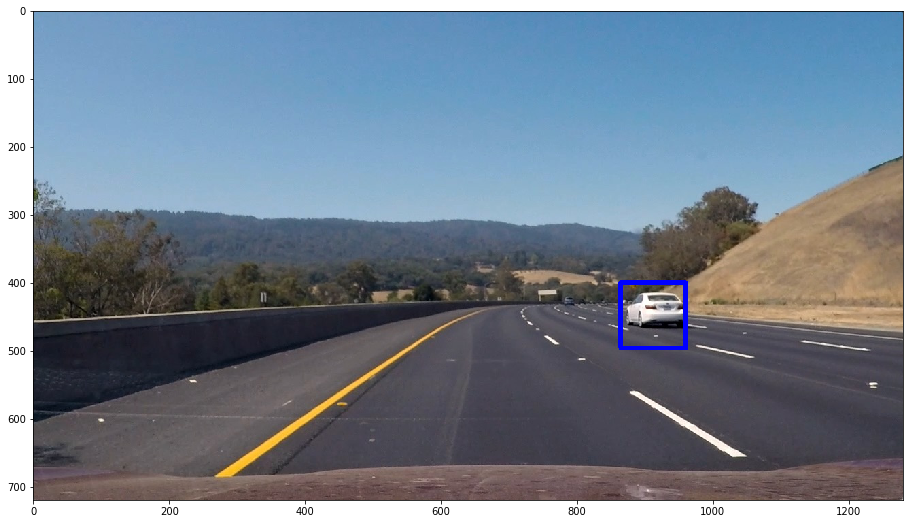

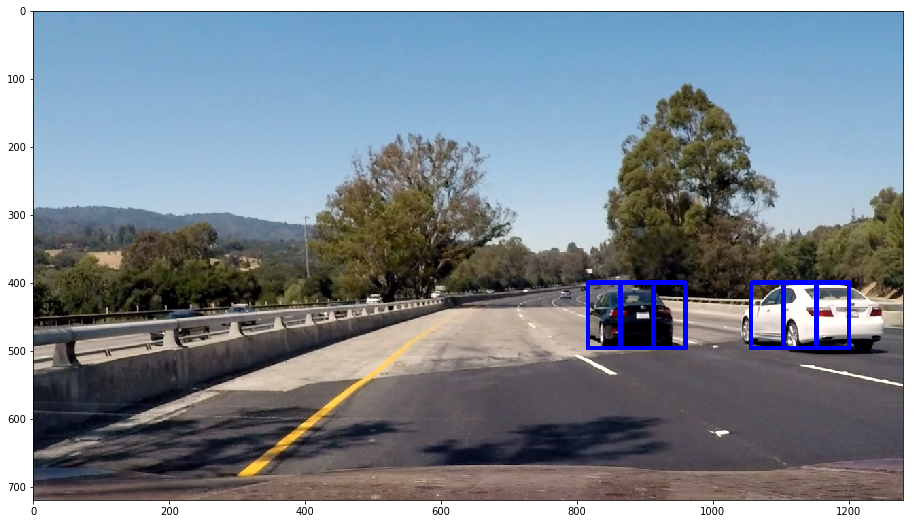

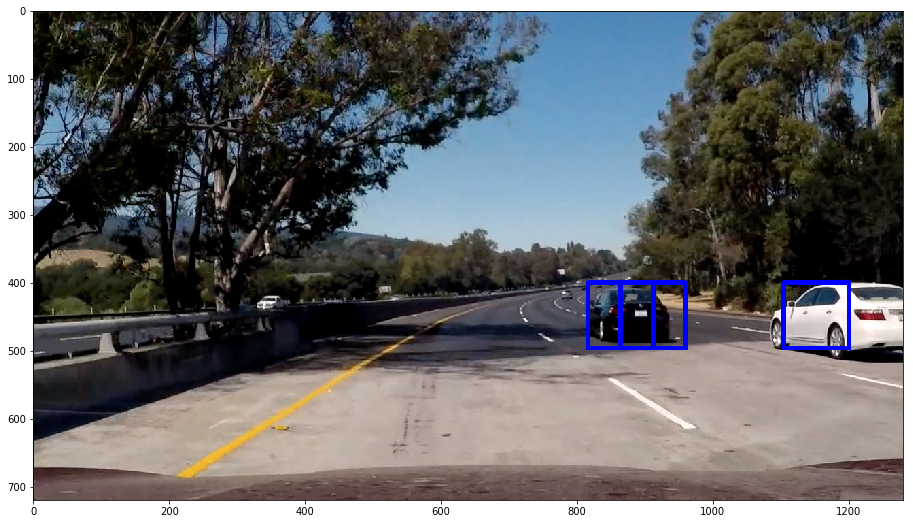

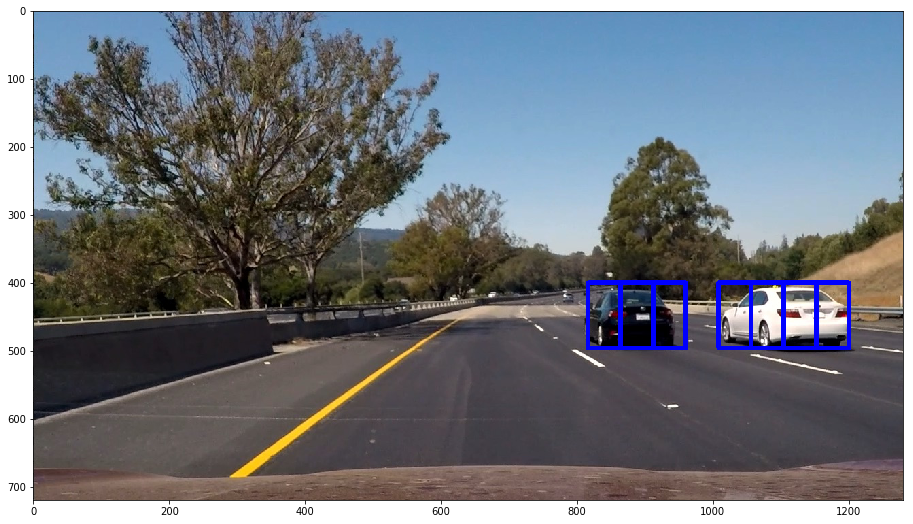

In [21]:
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    
    #draw_img = np.copy(img)
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YUV)
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    bboxs = []
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                bboxs.append([(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)])
                #cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                
    return bboxs

ystart = 400
ystop = 656
scale = 1.5
count = 1
for ti in test_imgs:
    img = loadImg(ti, color_space="RGB")
    
    bboxs = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    window_img = draw_boxes(img, bboxs)
    f, (ax1) = plt.subplots(1, 1, figsize=(24, 9))
    ax1.imshow(window_img)
    
    f.savefig('./output_images/windows/Sliding-Window{0}.png'.format(count), dpi=100)
    count += 1

### Heat Map

In [23]:
def add_heat(heatmap, bbox_list):
    for box in bbox_list:
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1.0

    return heatmap

def cool_down(heatmap):
    heatmap = 0.66*heatmap
    return heatmap

def apply_threshold(heatmap, threshold):
    newHeat = np.copy(heatmap)
    newHeat[newHeat <= threshold] = 0
    return newHeat

def draw_heat_box(img, heatmap):
    labels = label(heatmap)
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        
        # Define a bounding box
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    return img

### Sliding Window With Heat

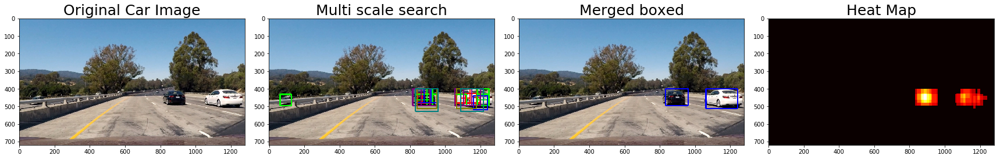

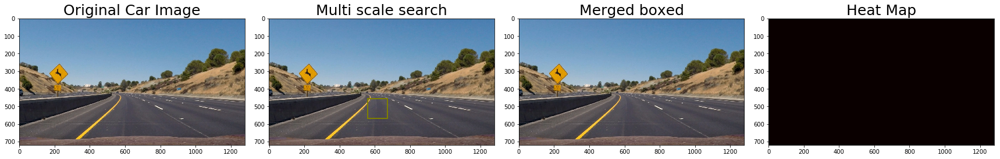

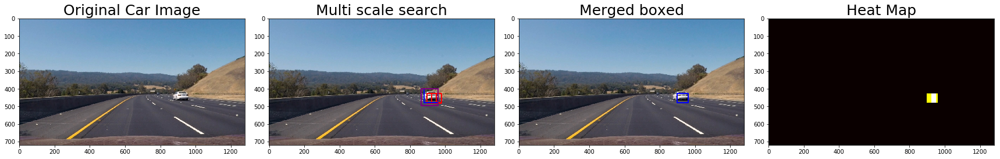

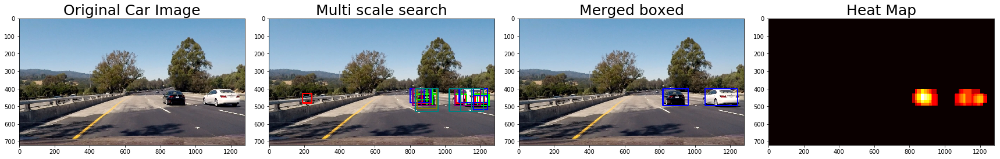

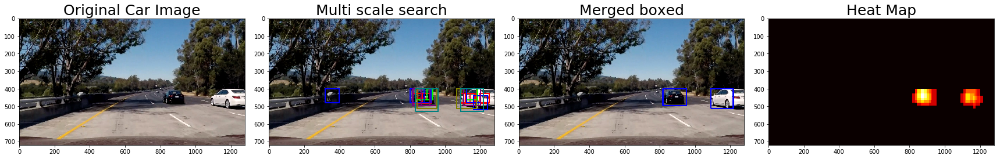

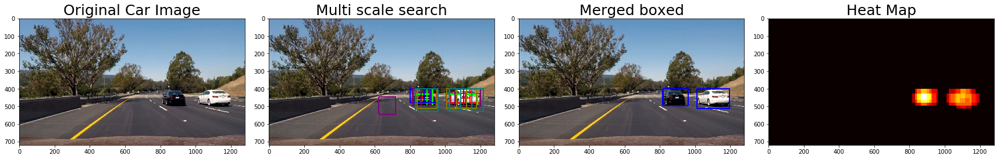

In [24]:
scales = [.85, 1.0, 1.25, 1.5, 1.75, 2.0]
ystops = [530, 550, 575, 625, 625, 650]
ystarts = [400, 400, 400, 400, 400, 400]
red_c = (255,0,0)
green_c = (0,255,0)
blue_c = (0, 0, 255)
a = (127,0, 127)
b = (127,127, 0)
c = (0,127, 127)
colours = [red_c, green_c, blue_c, a, b, c]

count = 1
for ti in test_imgs:
    img = loadImg(ti, color_space="RGB")
    img_with_bb = np.copy(img)
    heatmap = np.zeros_like(img[:,:,0]).astype(np.float)
    for i in range(len(scales)):
        bboxs = find_cars(img, ystarts[i], ystops[i], scales[i], svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        heatmap = add_heat(heatmap, bboxs)
        img_with_bb = draw_boxes(img_with_bb, bboxs, color=colours[i])
        
    heatmap = apply_threshold(heatmap, 2.0)
    mergedHeatMap = draw_heat_box(np.copy(img), heatmap)
    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Car Image', fontsize=25)
    
    ax2.imshow(img_with_bb)
    ax2.set_title('Multi scale search', fontsize=25)
        
    ax3.imshow(mergedHeatMap)
    ax3.set_title("Merged boxed", fontsize=25)
        
    ax4.imshow(heatmap, cmap='hot')
    ax4.set_title("Heat Map", fontsize=25)
    f.savefig('./output_images/Heatmaps/window-with-heatmap{0}.png'.format(count), dpi=100)
    count += 1

## Apply pipline to video file

In [25]:
scales = [.85, 1.0, 1.25, 1.5, 1.75, 2.0]
ystops = [530, 550, 575, 625, 625, 650]
ystarts = [400, 400, 400, 400, 400, 400]
def process_image(img):
    global heat
    heat = cool_down(heat)
    for i in range(len(scales)):
        bboxs = find_cars(img, ystarts[i], ystops[i], scales[i], svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        heat = add_heat(heat, bboxs)
    heat = apply_threshold(heat, 2.0)
    return draw_heat_box(img, heat)



### Process video 1

In [26]:
heatimg = loadImg("./test_images/test1.jpg")
heat = np.zeros_like(heatimg[:,:,0]).astype(np.float)

input_video = "./project_video.mp4"
#input_video = './test_video.mp4'

output_video = 'output_video.mp4'


clip1 = VideoFileClip(input_video)
output_clip = clip1.fl_image(process_image)
%time output_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video output_video.mp4
[MoviePy] Writing video output_video.mp4


100%|█████████▉| 1260/1261 [11:46<00:00,  1.81it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video.mp4 

Wall time: 11min 47s


### Displaying output of video 1

In [27]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))